<a href="https://colab.research.google.com/github/malaireumarianna/DS_projects/blob/main/Copy_of_linregression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/malaireumarianna/DS_projects.git

Cloning into 'DS_projects'...
remote: Enumerating objects: 45, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 45 (delta 7), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (45/45), 3.64 MiB | 5.91 MiB/s, done.
Resolving deltas: 100% (7/7), done.


In [ ]:
!pip install ydata_profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 22.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 30.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 8.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 83.2 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=e4538fcec320d0948c43671d5dabdd764a0b3b5741cf04320c73b3a0ee65dddc
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


## 1. EDA:
Below will be represented some univariate and multivariate analysis of our dataset.

In [ ]:
import pandas as pd


air_data = pd.read_csv("/content/DS_projects/LinRegression/AirQualityUCI.csv",  sep=';')



In [ ]:
air_data.head(5)

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18.00.00,"2,6",1360.0,150.0,"11,9",1046.0,166.0,1056.0,113.0,1692.0,1268.0,"13,6","48,9","0,7578",NaN,NaN
1,10/03/2004,19.00.00,2,1292.0,112.0,"9,4",955.0,103.0,1174.0,92.0,1559.0,972.0,"13,3","47,7","0,7255",NaN,NaN
2,10/03/2004,20.00.00,"2,2",1402.0,88.0,"9,0",939.0,131.0,1140.0,114.0,1555.0,1074.0,"11,9","54,0","0,7502",NaN,NaN
3,10/03/2004,21.00.00,"2,2",1376.0,80.0,"9,2",948.0,172.0,1092.0,122.0,1584.0,1203.0,"11,0","60,0","0,7867",NaN,NaN
4,10/03/2004,22.00.00,"1,6",1272.0,51.0,"6,5",836.0,131.0,1205.0,116.0,1490.0,1110.0,"11,2","59,6","0,7888",NaN,NaN


In [ ]:
air_data = air_data.drop(columns=['Unnamed: 15',	'Unnamed: 16'])

In [ ]:
print(air_data.isna().sum())

Date             114
Time             114
CO(GT)           114
PT08.S1(CO)      114
NMHC(GT)         114
C6H6(GT)         114
PT08.S2(NMHC)    114
NOx(GT)          114
PT08.S3(NOx)     114
NO2(GT)          114
PT08.S4(NO2)     114
PT08.S5(O3)      114
T                114
RH               114
AH               114
dtype: int64


Drop entries with NAN.

In [ ]:
air_data = air_data.dropna()

In [ ]:
print("Dataset Overview:\n", air_data.info())

<class 'pandas.core.frame.DataFrame'>
Index: 9357 entries, 0 to 9356
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           9357 non-null   object 
 1   Time           9357 non-null   object 
 2   CO(GT)         9357 non-null   object 
 3   PT08.S1(CO)    9357 non-null   float64
 4   NMHC(GT)       9357 non-null   float64
 5   C6H6(GT)       9357 non-null   object 
 6   PT08.S2(NMHC)  9357 non-null   float64
 7   NOx(GT)        9357 non-null   float64
 8   PT08.S3(NOx)   9357 non-null   float64
 9   NO2(GT)        9357 non-null   float64
 10  PT08.S4(NO2)   9357 non-null   float64
 11  PT08.S5(O3)    9357 non-null   float64
 12  T              9357 non-null   object 
 13  RH             9357 non-null   object 
 14  AH             9357 non-null   object 
dtypes: float64(8), object(7)
memory usage: 1.1+ MB
Dataset Overview:
 None


AS we see from above, there are few numerical columns that hold object type, so transform them to numeric.


In [ ]:
# Replace commas with dots in the relevant columns
air_data['CO(GT)'] = air_data['CO(GT)'].str.replace(',', '.')
air_data['C6H6(GT)'] = air_data['C6H6(GT)'].str.replace(',', '.')
air_data['T'] = air_data['T'].str.replace(',', '.')
air_data['AH'] = air_data['AH'].str.replace(',', '.')
air_data['RH'] = air_data['RH'].str.replace(',', '.')


air_data['CO(GT)'] = pd.to_numeric(air_data['CO(GT)'])
air_data['C6H6(GT)'] = pd.to_numeric(air_data['C6H6(GT)'])
air_data['T'] = pd.to_numeric(air_data['T'])
air_data['AH'] = pd.to_numeric(air_data['AH'])
air_data['RH'] = pd.to_numeric(air_data['RH'])

In [ ]:
print("Descriptive Statistics:")
print(air_data.describe())

Descriptive Statistics:
            CO(GT)  PT08.S1(CO)     NMHC(GT)     C6H6(GT)  PT08.S2(NMHC)  \
count  9357.000000  9357.000000  9357.000000  9357.000000    9357.000000   
mean    -34.207524  1048.990061  -159.090093     1.865683     894.595276   
std      77.657170   329.832710   139.789093    41.380206     342.333252   
min    -200.000000  -200.000000  -200.000000  -200.000000    -200.000000   
25%       0.600000   921.000000  -200.000000     4.000000     711.000000   
50%       1.500000  1053.000000  -200.000000     7.900000     895.000000   
75%       2.600000  1221.000000  -200.000000    13.600000    1105.000000   
max      11.900000  2040.000000  1189.000000    63.700000    2214.000000   

           NOx(GT)  PT08.S3(NOx)      NO2(GT)  PT08.S4(NO2)  PT08.S5(O3)  \
count  9357.000000   9357.000000  9357.000000   9357.000000  9357.000000   
mean    168.616971    794.990168    58.148873   1391.479641   975.072032   
std     257.433866    321.993552   126.940455    467.210125   4

From descriptive statistics above we can see that variables have a wide range of mean values. For example, C6H6(GT) has a mean of 1.86, while PT08.S4(NO2) has a much higher mean of 1391.48.
Standard deviations are also high for many variables, indicating significant variability. So the best choice would be to scale the features for further prediction of target.


Primarily, a we can see from univariate analysis below, there are plenty of negative values in defferent features.

For example, "CO(GT)" has negative	1683 entries out of 9357, while "NMHC(GT)" has 	8443 negative values, which indicates missing values. Correlation of "NMHC(GT)" is almost zero, due to lack of data, so this column is not representative at all, it will be reasonable to drop it out of dataset.

Other features, also contain negative (missing) values, and they often have same value of 366 negative	values, which might mean that we have completelly irrepresetative rows, so it might be resonable to drop rows where all features result in -200 value.







For multivariate analysis, from corretation matrix we see potential multicolineariry.
There are features like "PT08.S1(CO)", 	"PT08.S2(NMHC)", 	"PT08.S4(NO2)",	"PT08.S5(O3)" that highly correlate with target, and they have quite high correlation berween each other.
So, it might be beneficial for the model to drop some of them.

In [ ]:
import ydata_profiling
profile = ydata_profiling.ProfileReport(air_data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Below is calculated variance inflation factor which helps to determine degree of multicolinearity in variables.
If VIF > 10 for some feature, then this feature can be represented as linear combination of others, so keeping all of them might make model struggle to assign resonable weights for prediction, it can lead to overfitting. SO it should be processed somehow.

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd
import statsmodels.api as sm


# Select only independent variables
predictors = air_data.drop(columns=["C6H6(GT)", "Date",	"Time"])  # Exclude the target variable

# Add a constant for VIF calculation
predictors = sm.add_constant(predictors)

# Compute VIF for each feature
vif = pd.DataFrame()
vif["Variable"] = predictors.columns
vif["VIF"] = [variance_inflation_factor(predictors.values, i) for i in range(predictors.shape[1])]

print(vif)


         Variable         VIF
0           const  347.755973
1          CO(GT)    1.899757
2     PT08.S1(CO)   21.332743
3        NMHC(GT)    1.552380
4   PT08.S2(NMHC)   31.005597
5         NOx(GT)    6.965104
6    PT08.S3(NOx)    6.860486
7         NO2(GT)    5.207615
8    PT08.S4(NO2)   21.487389
9     PT08.S5(O3)   11.518831
10              T  181.049578
11             RH   41.616001
12             AH  360.029623


##2. Data preparation:

For now, from the pair -"PT08.S5(O3)" - "PT08.S1(CO)" which has correaltion 0.906, I will retain "PT08.S1(CO)" as it has higher correlation with target - 0.902.

From pair - "PT08.S2(NMHC)" - "PT08.S1(CO)" which has correaltion 0.902, I will retain "PT08.S2(NMHC)" as it has higher correlation with target - 1.00.


"PT08.S5(O3)" and "PT08.S1(CO)" will be dropped from further analysis.

In [ ]:

air_data = air_data.drop(columns=["PT08.S1(CO)", "PT08.S5(O3)"])


Below, I drop "NMHC(GT)" as it is almost empty, and also I will drop rows that contain -200 in all attributes.

In [ ]:

air_data = air_data.drop(columns=["NMHC(GT)"])


In [ ]:
# filter the rows, keeping only those where at least one value is not -200.

filtered_data = air_data[(air_data != -200).any(axis=1)]


print(filtered_data)


            Date      Time  CO(GT)  C6H6(GT)  PT08.S2(NMHC)  NOx(GT)  \
0     10/03/2004  18.00.00     2.6      11.9         1046.0    166.0   
1     10/03/2004  19.00.00     2.0       9.4          955.0    103.0   
2     10/03/2004  20.00.00     2.2       9.0          939.0    131.0   
3     10/03/2004  21.00.00     2.2       9.2          948.0    172.0   
4     10/03/2004  22.00.00     1.6       6.5          836.0    131.0   
...          ...       ...     ...       ...            ...      ...   
9352  04/04/2005  10.00.00     3.1      13.5         1101.0    472.0   
9353  04/04/2005  11.00.00     2.4      11.4         1027.0    353.0   
9354  04/04/2005  12.00.00     2.4      12.4         1063.0    293.0   
9355  04/04/2005  13.00.00     2.1       9.5          961.0    235.0   
9356  04/04/2005  14.00.00     2.2      11.9         1047.0    265.0   

      PT08.S3(NOx)  NO2(GT)  PT08.S4(NO2)     T    RH      AH  
0           1056.0    113.0        1692.0  13.6  48.9  0.7578  
1      

Since my filtering didn't drop any rows, there is still need to impute missing values.

Since we have basically time series data, then linear interpolation might be beneficial in this case. Or imputation by the help of highly correlated attribute to ours, but in this case both attribute can have missing values and imputation will not be possible.
So for now I will try to impute by using interpolation.

In [ ]:
# Combine Date and Time into a single datetime column
filtered_data["datetime"] = pd.to_datetime(filtered_data["Date"] + " " + filtered_data["Time"], format="%d/%m/%Y %H.%M.%S", errors="coerce")

# Sort the dataset by the datetime column in ascending order
filtered_data = filtered_data.sort_values(by="datetime", ascending=True)




In [ ]:
import numpy as np


filtered_data = filtered_data.replace(-200, np.nan)
# Apply interpolation
filtered_data = filtered_data.interpolate(method='linear', axis=0) #column-wise operation

print(filtered_data.isnull().sum())



Date             0
Time             0
CO(GT)           0
C6H6(GT)         0
PT08.S2(NMHC)    0
NOx(GT)          0
PT08.S3(NOx)     0
NO2(GT)          0
PT08.S4(NO2)     0
T                0
RH               0
AH               0
datetime         0
dtype: int64


<ipython-input-11-9e91fe7e6bcc>:6: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  filtered_data = filtered_data.interpolate(method='linear', axis=0) #column-wise operation


I will drop non-numerical features for further preparation of dataset for feeding to the model.

In [ ]:


filtered_data = filtered_data.drop(columns=['datetime', 'Date', 'Time'])


## 3. Prediction of C6H6(GT)

Below function calculates error metrics (MSE, RMSE, MAE, R^2) for predicted and actual values. Calculation will be performed on original scale of target. Since target value is standartized, it will be used inverse transform for further calculation.

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

def calculate_error_scores(y_true, y_pred, y_scaler):


    """Returns:
    dict: Dictionary containing calculated error metrics (MSE, RMSE, MAE, R^2).
    """
    # inverse-transform the values
    if y_scaler:
        y_true = y_scaler.inverse_transform(y_true)
        y_pred = y_scaler.inverse_transform(y_pred)

    # calculate metrics
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)



    metrics = {
        "Mean Squared Error (MSE)": mse,
        "Root Mean Squared Error (RMSE)": rmse,
        "Mean Absolute Error (MAE)": mae,
        "R-Squared (R2)": r2
    }


    print("Error Metrics:")
    for metric, value in metrics.items():
        print(f"{metric}: {value:.4f}")



    return metrics


Below is presented fuction which plots scatter plot for predicted vs actual values of model and histogram of residuals.

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

def plot_residuals(y_true, y_pred, y_scaler=None):
    """
     visualizes predictions and residuals."""


    # inverse-transform the values
    if y_scaler:
        y_true = y_scaler.inverse_transform(y_true)
        y_pred = y_scaler.inverse_transform(y_pred)


    # plot scatter plot of predicted vs actual values
    plt.figure(figsize=(12, 6))

    plt.subplot(1, 2, 1)
    plt.scatter(y_true, y_pred, alpha=0.7, edgecolor='k')
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], color='red', linestyle='--')
    plt.title("Predicted vs Actual Values")
    plt.xlabel("Actual Values")
    plt.ylabel("Predicted Values")
    plt.grid(True)

    # plot histogram of residuals
    residuals = y_true - y_pred

    plt.subplot(1, 2, 2)
    plt.hist(residuals, bins=30, edgecolor='k', alpha=0.7)
    plt.title("Histogram of Residuals")
    plt.xlabel("Residuals")
    plt.ylabel("Frequency")
    plt.grid(True)

    plt.tight_layout()
    plt.show()



Below is represented function which splits data into train and test sets. 20% of data is used for testing.

In [ ]:

from sklearn.model_selection import train_test_split


def split_data(pipeline, y_scaller, poly=False, cross_val=False):
    # separate features (X) and target (y)
    X = filtered_data.drop(columns=["C6H6(GT)"])
    y = filtered_data["C6H6(GT)"]


    X_transformed = pipeline.fit_transform(X)

    y_scaled = y_scaller.fit_transform(y.values.reshape(-1, 1))

    # Train-test split
    X_train, X_test, y_train, y_test = train_test_split(X_transformed, y_scaled, test_size=0.2, random_state=42)

    if poly:
      # Some predictions will be based on data with polynomial features
      poly = pipeline.named_steps["poly"]

      transformed_df = pd.DataFrame(
          X_transformed,
          columns=poly.get_feature_names_out(X.columns))  # feature names from PolynomialFeatures

      return X_train, X_test, y_train, y_test, transformed_df

    elif cross_val:

      return X_transformed , y_scaled

    return X_train, X_test, y_train, y_test

The very first prediction model will be Linear regression withour regularization, performed on original scalled features.

Below is applied standad scaller to numerical features to keep data within the same value range.

In [ ]:

from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import Pipeline


# pipeline for scaling
pipeline = Pipeline([

    ("scaler", StandardScaler())

])


# scaler for the target variable
y_scaler = StandardScaler()

In [ ]:
from sklearn.linear_model import LinearRegression

X_train, X_test, y_train, y_test = split_data(pipeline, y_scaler)

model = LinearRegression()

# fit the data
model.fit(X_train, y_train)

# predict on the test set
y_pred_lr_scaled = model.predict(X_test)

# feature names from data
feature_names = filtered_data.drop(columns=["C6H6(GT)"]).columns

# access model coefficients
coefficients = model.coef_

if len(coefficients.shape) > 1:
    coefficients = coefficients.flatten()

# define feature importance
feature_importance = pd.DataFrame({
    "Feature": feature_names,
    "Coefficient": coefficients,
    "Absolute Importance": np.abs(coefficients)
})

# sort features by absolute importance
feature_importance = feature_importance.sort_values(by="Absolute Importance", ascending=False)


print("Feature Importance:")
print(feature_importance)



Feature Importance:
         Feature  Coefficient  Absolute Importance
1  PT08.S2(NMHC)     1.065704             1.065704
3   PT08.S3(NOx)     0.132788             0.132788
6              T    -0.111840             0.111840
4        NO2(GT)    -0.065785             0.065785
8             AH     0.065490             0.065490
2        NOx(GT)     0.057149             0.057149
7             RH    -0.054248             0.054248
0         CO(GT)     0.041359             0.041359
5   PT08.S4(NO2)    -0.001199             0.001199


Error Metrics:
Mean Squared Error (MSE): 1.3954
Root Mean Squared Error (RMSE): 1.1813
Mean Absolute Error (MAE): 0.8530
R-Squared (R2): 0.9758


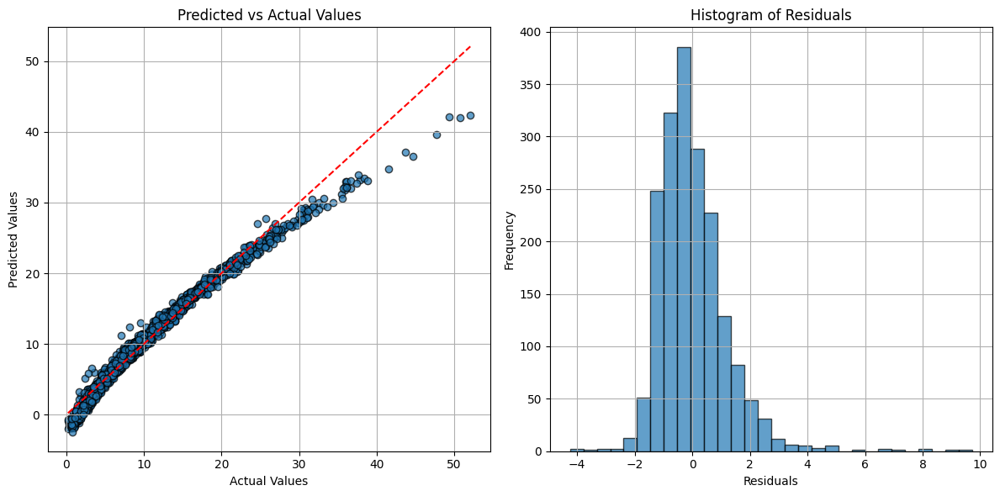

In [ ]:

# calculate errors for unscaled target and predicted values from Linear Regression

metrics = calculate_error_scores(y_test, y_pred_lr_scaled, y_scaler)

#plot residuals

plot_residuals(y_test, y_pred_lr_scaled, y_scaler)

For linear regression on scaled original features, the results are promising, indicating quite good model performance.


Root Mean Squared Error (RMSE), which measures prediction accuracy in the same unit as the target variable, is resonable small - 1.1813.
Mean Absolute Error (MAE): 0.8530

R² score is close to 1, which means that model explains variability in the target variable quite well.

From the scatter plot we see that predictions closely align with the actual values, as most points lie near the diagonal red line.

Residuals are approximately normally distributed around zero, indicating that the model captures the data well.
Slight asymmetry is seen, which could mean that data contains some outliers on the right-hand side, like extremelly large values.

Probsbly in this case, log-scalling of target could help to treat these extreme values. But let's see how models will perform on polynomial features.


In [ ]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np

#  reusable pipeline function for regression model
def create_pipeline(regressor):
    return Pipeline([
        ("regressor", regressor)
    ])



In [ ]:

# pipeline for polynomial feature generation and scaling
poly_pipeline = Pipeline([
    ("poly", PolynomialFeatures(degree=2, include_bias=False)),
    ("scaler", StandardScaler())
])


In [ ]:

from sklearn.linear_model import LinearRegression


X_train, X_test, y_train, y_test, X_transformed = split_data(poly_pipeline, y_scaler, poly=True)


lin_regress_pipeline = create_pipeline(LinearRegression())

# fit the pipeline
lin_regress_pipeline.fit(X_train, y_train)

# predict on the test set
y_pred_lr_scaled = lin_regress_pipeline.predict(X_test)


# feature names
feature_names = X_transformed.columns

# access model coefficients
coefficients = lin_regress_pipeline['regressor'].coef_


if len(coefficients.shape) > 1:
    coefficients = coefficients.flatten()

#  feature importance
feature_importance = pd.DataFrame({
    "Feature": feature_names,
    "Coefficient": coefficients,
    "Absolute Importance": np.abs(coefficients)
})


feature_importance = feature_importance.sort_values(by="Absolute Importance", ascending=False)

# Display feature importance
print("Feature Importance:")
print(feature_importance)





Feature Importance:
                       Feature  Coefficient  Absolute Importance
18             PT08.S2(NMHC)^2     1.066299             1.066299
8                           AH    -0.157569             0.157569
23             PT08.S2(NMHC) T     0.131547             0.131547
50                        T AH     0.120528             0.120528
25            PT08.S2(NMHC) AH    -0.071606             0.071606
6                            T    -0.066837             0.066837
45              PT08.S4(NO2) T    -0.060229             0.060229
49                        T RH     0.055631             0.055631
24            PT08.S2(NMHC) RH     0.055241             0.055241
47             PT08.S4(NO2) AH     0.053861             0.053861
1                PT08.S2(NMHC)    -0.052706             0.052706
22  PT08.S2(NMHC) PT08.S4(NO2)    -0.052135             0.052135
5                 PT08.S4(NO2)     0.049132             0.049132
3                 PT08.S3(NOx)     0.042880             0.042880
29   

Error Metrics:
Mean Squared Error (MSE): 0.0101
Root Mean Squared Error (RMSE): 0.1005
Mean Absolute Error (MAE): 0.0561
R-Squared (R2): 0.9998


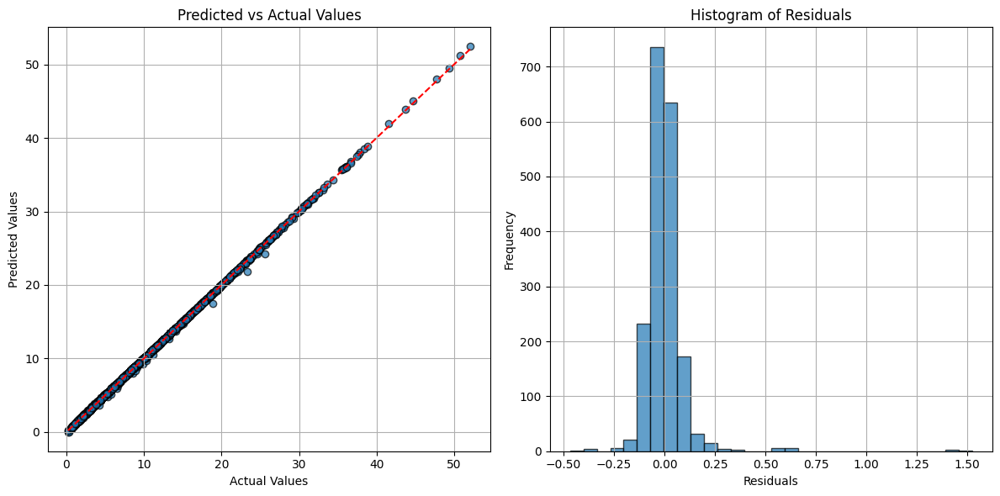

In [ ]:

# calculate errors for unscaled target and predicted values from Linear Regression

metrics = calculate_error_scores(y_test, y_pred_lr_scaled, y_scaler)

#plot residuals

plot_residuals(y_test, y_pred_lr_scaled, y_scaler)

From results above we can see that, feature "PT08.S2(NMHC)^2" has highest insfluence on prediction. Even without polynomial degree, this feature has highest absolute importance.

Errors, such as MSE, MAE are extremely low, showing accurate predictions for most observations.
RMSE of 0.1005 is significantly lower than in first experiment, and indicates basically minimal difference between target and predicted values.

R² score indicates that 99.98% of the variability in the target variable is explained by the model, which is near-perfect performance.

Scatter plot almost perfectly fits to red line.
Residuals are centered around 0 with a narrow spread, showing minimal error in predictions.


Below will be performed Ridge and Lasso regression with grid search to find best alpha parameter on train set.

And also will be performed cross-validation on whole dataset.

In [ ]:

from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV, cross_val_score

X, y = split_data(poly_pipeline, y_scaler, poly=False, cross_val=True)

X_train, X_test, y_train, y_test, X_transformed = split_data(poly_pipeline, y_scaler, poly=True)

ridge_pipeline = create_pipeline(Ridge())

# hyperparameter tuning for Ridge

param_grid = {
    "regressor__alpha": [0.01, 0.1, 1, 10]
}

grid_search = GridSearchCV(ridge_pipeline, param_grid, scoring="neg_mean_squared_error", cv=5)
grid_search.fit(X_train, y_train)
print("Best alpha for Ridge:", grid_search.best_params_)


best_ridge_pipeline = grid_search.best_estimator_


y_pred_ridge_scaled = best_ridge_pipeline.predict(X_test)


# access model coefficients
coefficients = best_ridge_pipeline['regressor'].coef_


if len(coefficients.shape) > 1:
    coefficients = coefficients.flatten()


feature_importance = pd.DataFrame({
    "Feature": feature_names,
    "Coefficient": coefficients,
    "Absolute Importance": np.abs(coefficients)
})


feature_importance = feature_importance.sort_values(by="Absolute Importance", ascending=False)


print("Feature Importance:")
print(feature_importance)

Best alpha for Ridge: {'regressor__alpha': 0.1}
Feature Importance:
                       Feature  Coefficient  Absolute Importance
18             PT08.S2(NMHC)^2     1.040913             1.040913
8                           AH    -0.144108             0.144108
50                        T AH     0.101506             0.101506
23             PT08.S2(NMHC) T     0.099576             0.099576
25            PT08.S2(NMHC) AH    -0.058603             0.058603
6                            T    -0.057967             0.057967
49                        T RH     0.053436             0.053436
3                 PT08.S3(NOx)     0.046133             0.046133
47             PT08.S4(NO2) AH     0.037031             0.037031
29        NOx(GT) PT08.S4(NO2)    -0.035588             0.035588
7                           RH     0.033650             0.033650
2                      NOx(GT)    -0.031291             0.031291
24            PT08.S2(NMHC) RH     0.029350             0.029350
45              PT08.S

In [ ]:

from sklearn.model_selection import cross_val_predict


# perform cross-validation and get predictions
y_pred_cv_scaled = cross_val_predict(best_ridge_pipeline, X, y, cv=5)

# calculate cross-validation error metrics using the provided function
cv_metrics = calculate_error_scores(y, y_pred_cv_scaled.reshape(-1, 1), y_scaler=y_scaler)

print("\nCross-Validation Error Metrics:")
for metric, value in cv_metrics.items():
    print(f"{metric}: {value:.4f}")


Error Metrics:
Mean Squared Error (MSE): 0.0209
Root Mean Squared Error (RMSE): 0.1445
Mean Absolute Error (MAE): 0.0946
R-Squared (R2): 0.9996

Cross-Validation Error Metrics:
Mean Squared Error (MSE): 0.0209
Root Mean Squared Error (RMSE): 0.1445
Mean Absolute Error (MAE): 0.0946
R-Squared (R2): 0.9996


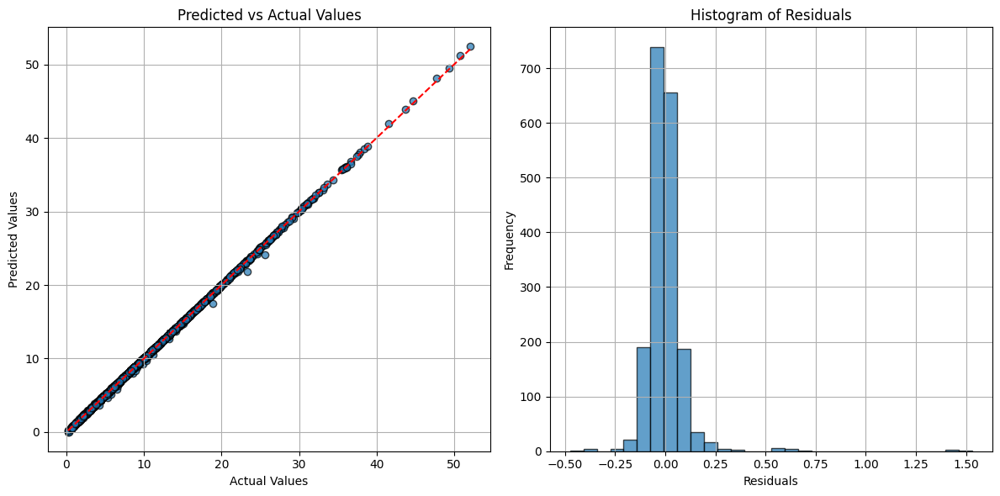

In [ ]:

#plot residuals

plot_residuals(y_test, y_pred_ridge_scaled, y_scaler)

In [ ]:
# usage with Ridge regression
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV, cross_val_score


X, y = split_data(poly_pipeline, y_scaler, poly=False, cross_val=True)

X_train, X_test, y_train, y_test, X_transformed = split_data(poly_pipeline, y_scaler, poly=True)


# hyperparameter tuning for Lasso

param_grid = {
    "regressor__alpha": [0.01, 0.1, 1, 10]
}

lasso = create_pipeline(Lasso())
grid_search = GridSearchCV(lasso, param_grid, scoring="neg_mean_squared_error", cv=5)
grid_search.fit(X_train, y_train)
print("Best alpha for Lasso:", grid_search.best_params_)

# Use the best parameters in a new pipeline
best_lasso_pipeline = grid_search.best_estimator_



y_pred_lasso_scaled = best_lasso_pipeline.predict(X_test)


# Access model coefficients
coefficients = best_lasso_pipeline['regressor'].coef_



if len(coefficients.shape) > 1:
    coefficients = coefficients.flatten()

# Create a DataFrame for feature importance
feature_importance = pd.DataFrame({
    "Feature": feature_names,
    "Coefficient": coefficients,
    "Absolute Importance": np.abs(coefficients)
})

feature_importance = feature_importance.sort_values(by="Absolute Importance", ascending=False)


print("Feature Importance:")
print(feature_importance)




Best alpha for Lasso: {'regressor__alpha': 0.01}
Feature Importance:
                       Feature  Coefficient  Absolute Importance
18             PT08.S2(NMHC)^2     0.986059             0.986059
10        CO(GT) PT08.S2(NMHC)     0.003868             0.003868
0                       CO(GT)     0.000000             0.000000
40        NO2(GT) PT08.S4(NO2)     0.000000             0.000000
30                   NOx(GT) T     0.000000             0.000000
31                  NOx(GT) RH     0.000000             0.000000
32                  NOx(GT) AH     0.000000             0.000000
33              PT08.S3(NOx)^2     0.000000             0.000000
34        PT08.S3(NOx) NO2(GT)    -0.000000             0.000000
35   PT08.S3(NOx) PT08.S4(NO2)    -0.000000             0.000000
36              PT08.S3(NOx) T    -0.000000             0.000000
37             PT08.S3(NOx) RH     0.000000             0.000000
38             PT08.S3(NOx) AH    -0.000000             0.000000
39                   

In [ ]:

from sklearn.model_selection import cross_val_predict

# perform cross-validation and get predictions
y_pred_cv_scaled = cross_val_predict(best_lasso_pipeline, X, y, cv=5)

# calculate cross-validation error metrics using the provided function
cv_metrics = calculate_error_scores(y, y_pred_cv_scaled.reshape(-1, 1), y_scaler=y_scaler)

print("\nCross-Validation Error Metrics:")
for metric, value in cv_metrics.items():
    print(f"{metric}: {value:.4f}")


Error Metrics:
Mean Squared Error (MSE): 0.0378
Root Mean Squared Error (RMSE): 0.1944
Mean Absolute Error (MAE): 0.1427
R-Squared (R2): 0.9993

Cross-Validation Error Metrics:
Mean Squared Error (MSE): 0.0378
Root Mean Squared Error (RMSE): 0.1944
Mean Absolute Error (MAE): 0.1427
R-Squared (R2): 0.9993


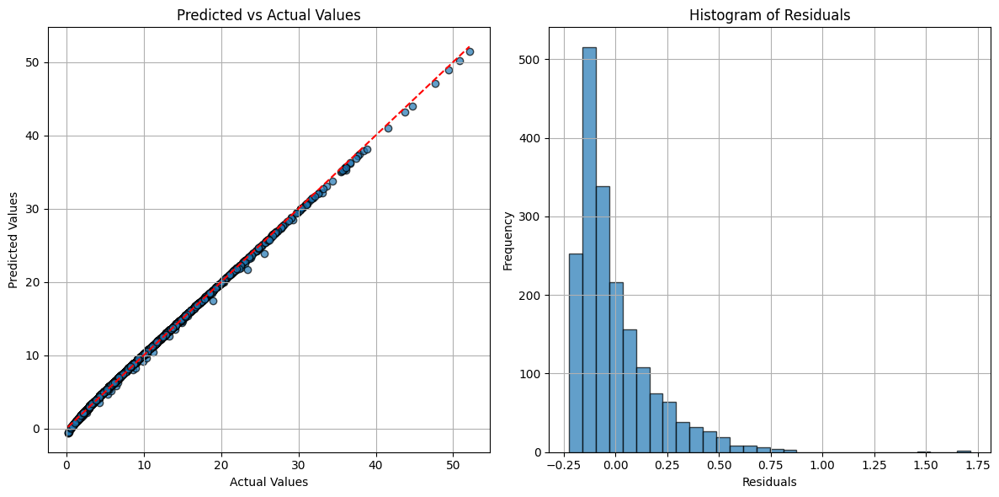

In [ ]:

#plot residuals

plot_residuals(y_test, y_pred_lasso_scaled.reshape(-1, 1), y_scaler)

From two experiments above, we see that Ridge keeps all features in the model but reduces the coefficients for less significant features.
The top feature is PT08.S2(NMHC)^2 with an absolute importance of 1.04.
Ridge allows smaller contributions, while Lasso sets many coefficients to 0, effectively performing feature selection.
Only 2 features (PT08.S2(NMHC)^2 and CO(GT) PT08.S2(NMHC)) have non-zero coefficients.
The most important feature remains PT08.S2(NMHC)^2 with an absolute importance of 0.98, similar to Ridge.

Ridge regression achieved slightly lower errors compared to Lasso.
And R² score of 0.9996, slightly better explained variance.


On scatter plots, Ridge and Lasso align predictions closely with the actual values in terms of diagonal line.

Ridge residuals are more narrowly distributed around 0.
Lasso residuals show a slightly wider spread, consistent with its higher RMSE and MAE.